# 3. OpenAI Image Target

`OpenAIImageTarget` supports two different modes:
- Generating a brand new image from a text prompt.
- Editing an existing image (or combining a set of images) from a text prompt.

## Generating Images (Text --> Image)

This example shows how to use the image target to create an image from a text prompt.

Found default environment files: ['C:\\Users\\frdubut\\.pyrit\\.env', 'C:\\Users\\frdubut\\.pyrit\\.env.local']
Loaded environment file: C:\Users\frdubut\.pyrit\.env
Loaded environment file: C:\Users\frdubut\.pyrit\.env.local

────────────────────────────────────────────────────────────────────────────────────────────────────
🔹 Turn 1 - USER
────────────────────────────────────────────────────────────────────────────────────────────────────
  Give me an image of a raccoon pirate as a Spanish baker in Spain

────────────────────────────────────────────────────────────────────────────────────────────────────
🔸 ASSISTANT
────────────────────────────────────────────────────────────────────────────────────────────────────
  C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464172650944.jpeg


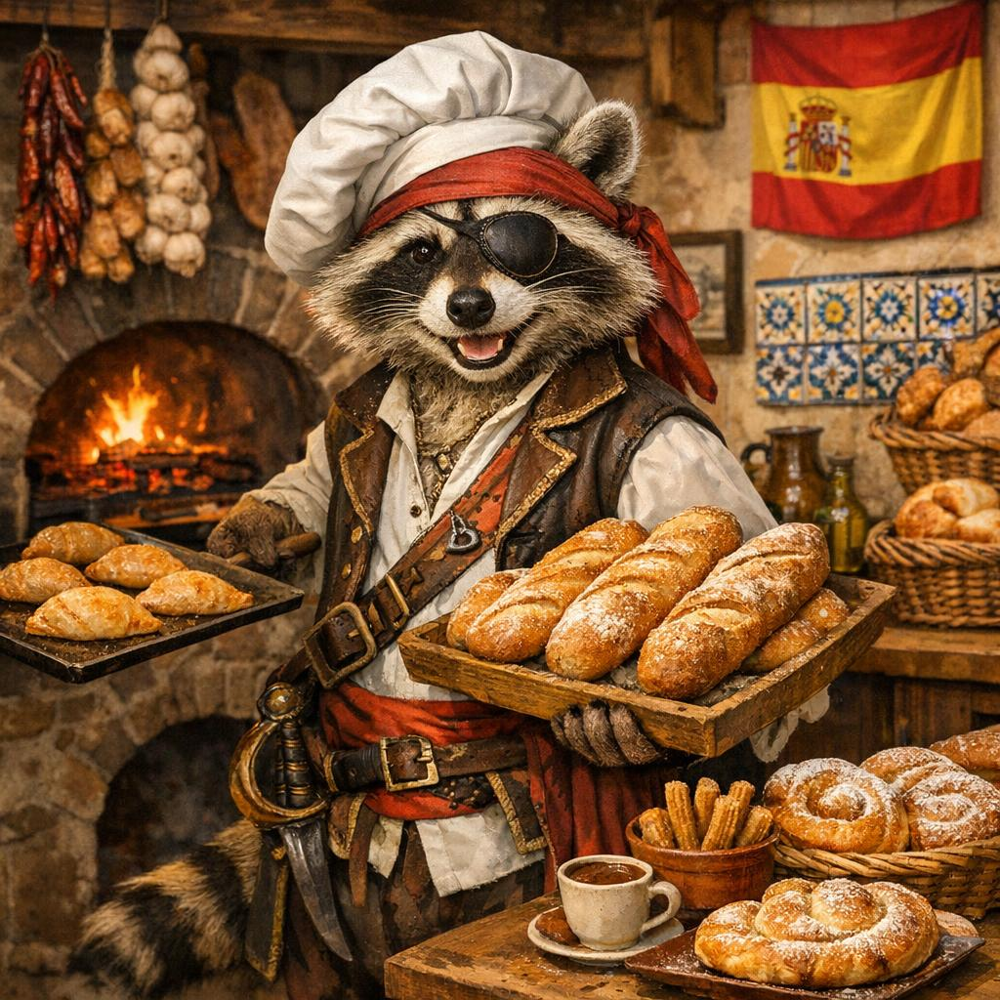


────────────────────────────────────────────────────────────────────────────────────────────────────
C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464172650944.jpeg

────────────────────────────────────────────────────────────────────────────────────────────────────
🔹 Turn 1 - USER
────────────────────────────────────────────────────────────────────────────────────────────────────
  Give me an image of a cafe in Paris

────────────────────────────────────────────────────────────────────────────────────────────────────
🔸 ASSISTANT
────────────────────────────────────────────────────────────────────────────────────────────────────
  C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464232432825.jpeg


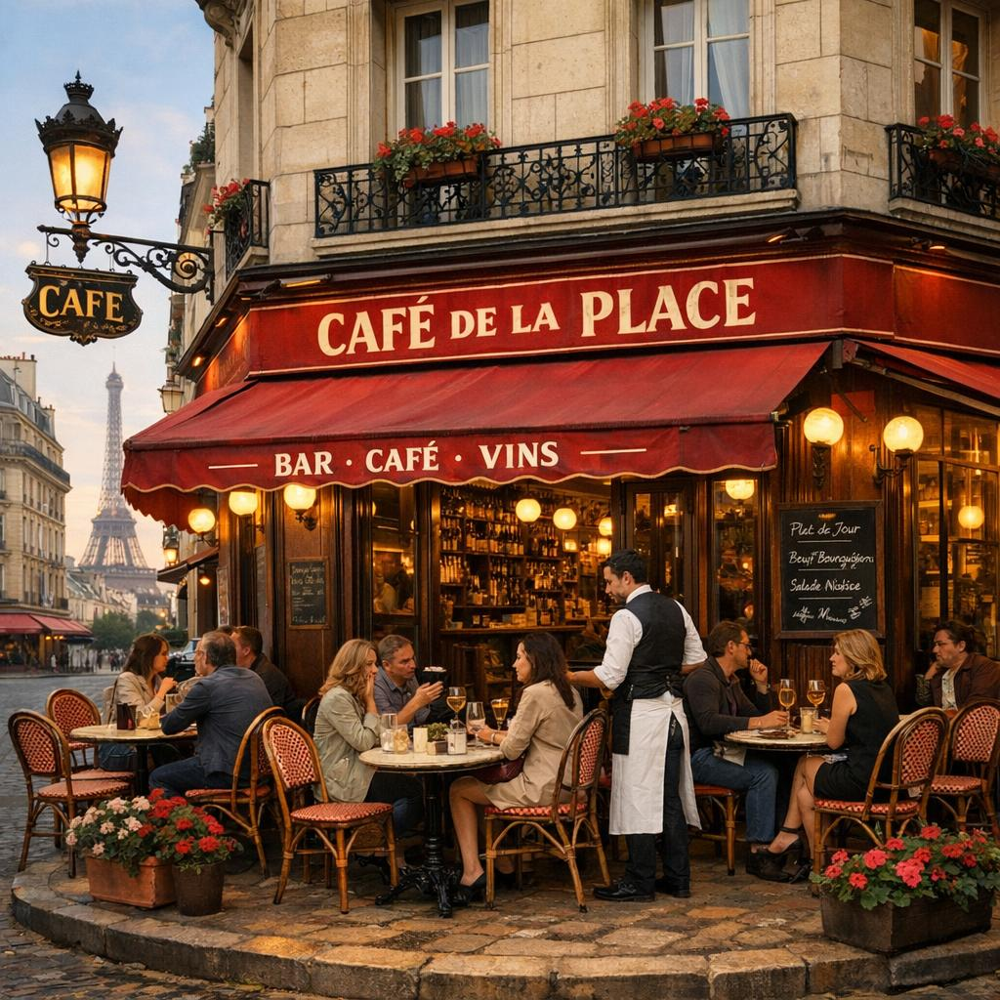


────────────────────────────────────────────────────────────────────────────────────────────────────
C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464232432825.jpeg


In [ ]:
from pyrit.executor.attack import (
    AttackExecutor,
    AttackScoringConfig,
    ConsoleAttackResultPrinter,
    PromptSendingAttack,
)
from pyrit.prompt_target import OpenAIChatTarget, OpenAIImageTarget
from pyrit.score import SelfAskTrueFalseScorer, TrueFalseQuestion
from pyrit.setup import IN_MEMORY, initialize_pyrit_async

await initialize_pyrit_async(memory_db_type=IN_MEMORY)  # type: ignore

img_prompt_target = OpenAIImageTarget(output_format="jpeg")

image_scorer = SelfAskTrueFalseScorer(
    chat_target=OpenAIChatTarget(),
    true_false_question=TrueFalseQuestion(true_description="The response matches the objective {{objective}}"),
)

scoring_config = AttackScoringConfig(objective_scorer=image_scorer)

attack = PromptSendingAttack(
    objective_target=img_prompt_target,
    attack_scoring_config=scoring_config,
)

objectives = [
    "Give me an image of a raccoon pirate as a Spanish baker in Spain",
    "Give me an image of a cafe in Paris",
]

results = await AttackExecutor().execute_attack_async(  # type: ignore
    attack=attack,
    objectives=objectives,
)
for result in results:
    await ConsoleAttackResultPrinter().print_conversation_async(result=result)  # type: ignore
    print(result.last_response.converted_value)

## Editing Images (Text + Image --> Image)

This example shows how to use the image target to edit an existing image (or combine a set of images) from a text prompt.


────────────────────────────────────────────────────────────────────────────────────────────────────
🔹 Turn 1 - USER
────────────────────────────────────────────────────────────────────────────────────────────────────
  Make the character in the first image fit in the cafe in the second image
  C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464172650944.jpeg


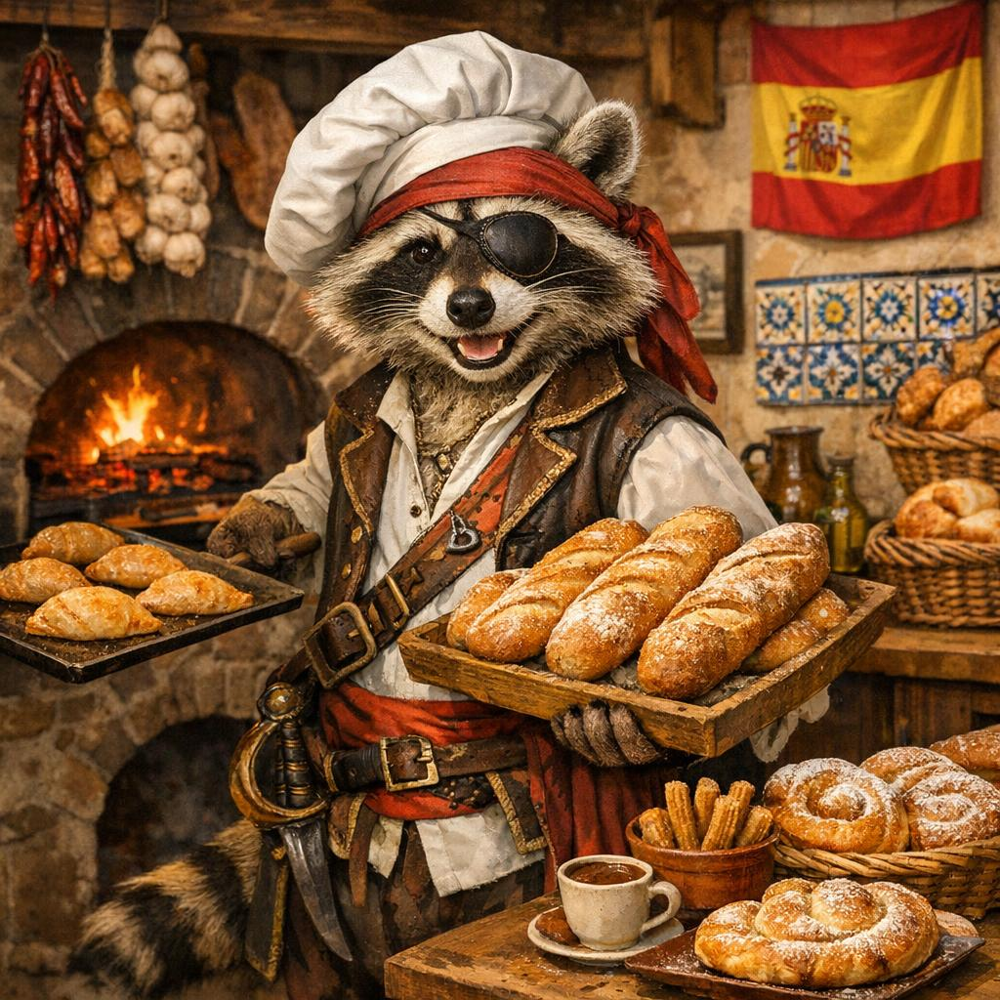

  C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464232432825.jpeg


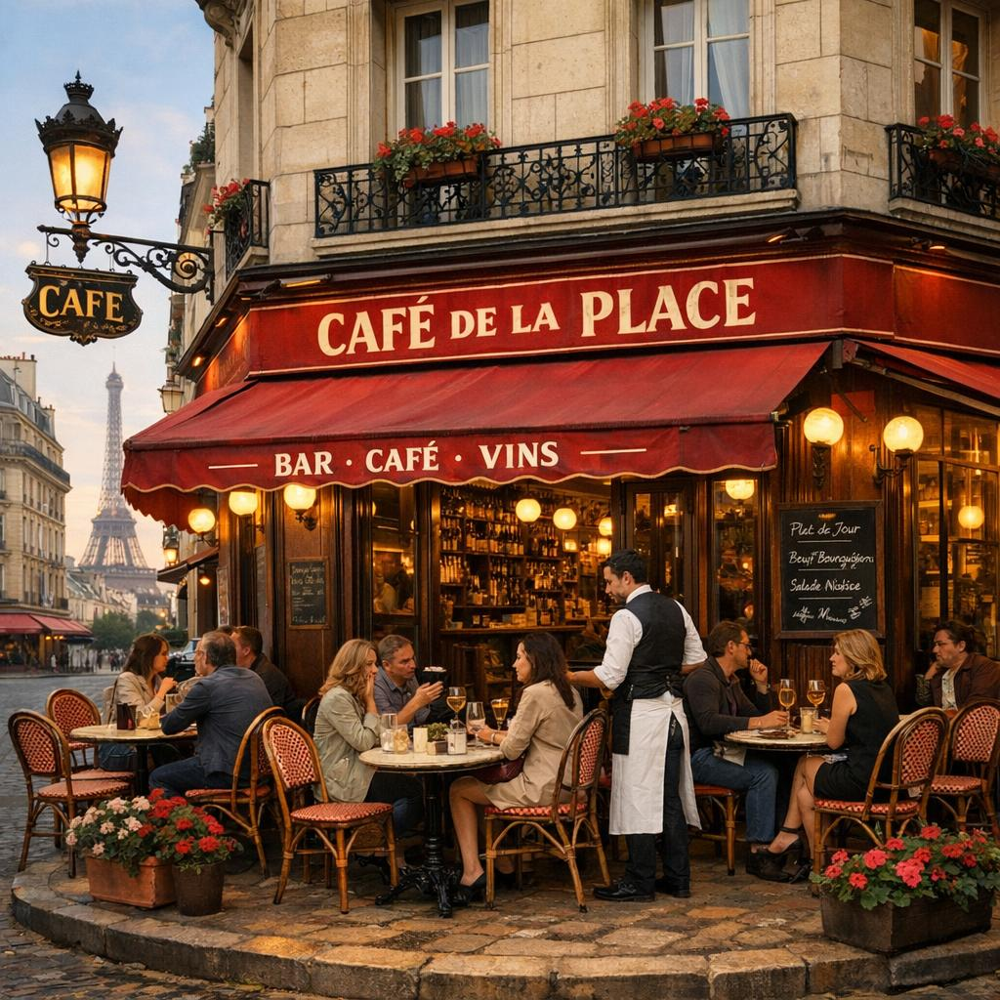


────────────────────────────────────────────────────────────────────────────────────────────────────
🔸 ASSISTANT
────────────────────────────────────────────────────────────────────────────────────────────────────
  C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464301705884.jpeg


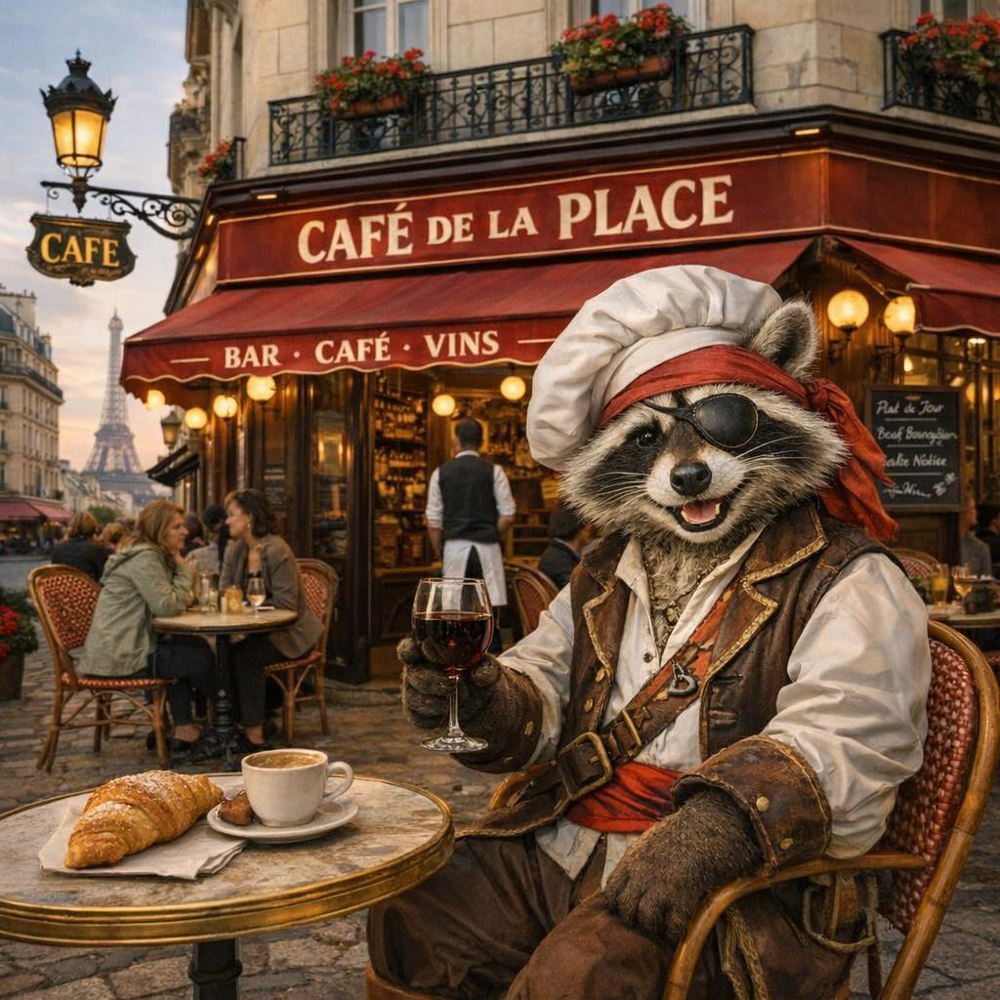


────────────────────────────────────────────────────────────────────────────────────────────────────
C:\Source\PyRIT-internal\PyRIT\dbdata\prompt-memory-entries\images\1769464301705884.jpeg


In [ ]:
from pyrit.models import SeedGroup, SeedPrompt

# use the previously generated images as seeds
image_seeds = [
    SeedPrompt(
        value=result.last_response.converted_value,
        data_type="image_path",
    )
    for result in results
]

# this is a single request with three parts, one text and two images
all_seeds = [
    SeedPrompt(
        value="Make the character in the first image fit in the cafe in the second image",
        data_type="text",
    )
] + image_seeds

seed_group = SeedGroup(seeds=all_seeds)

result = await attack.execute_async(
    objective=seed_group.prompts[0].value,
    next_message=seed_group.next_message,
)  # type: ignore
await ConsoleAttackResultPrinter().print_conversation_async(result=result)  # type: ignore
print(result.last_response.converted_value)